In [1]:
import matplotlib.pyplot as plt
import numpy as np
# from matplotlib_venn import venn2, venn2_circles, venn3_unweighted
# from mpl_toolkits.mplot3d import axes3d
# from mpl_toolkits import mplot3d
# from matplotlib_venn import venn3, venn3_circles
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import EngFormatter

import matplotlib.patches as patches
import matplotlib.transforms as transforms
import pandas as pd
import seaborn as sns
import os
import sys
import itertools
import logging 
from tqdm import tqdm, trange
# from tqdm.notebook import tqdm
from sklearn.neighbors import KDTree
from scipy.spatial import distance_matrix
from sklearn.decomposition import PCA, IncrementalPCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from numpy.linalg import svd
import umap
import scipy 
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import plot, iplot, init_notebook_mode
from sklearn.metrics import accuracy_score
from sklearn import datasets

pd.set_option('display.max_rows', 100)

## Single peak clustering - Formate

In [2]:
metabolites = pd.read_excel('~/Documents/IBS/Metadata/MIBS_NMR_data_signif_metabs.xlsx', header=1)
metabolites

,name,ppm,p-value,q-value,Exp_no,30,40,50,60,70,...,3010,3020,3030,10030,10050,10060,10090,10100,10140,10150
0,Bile salts,0.714953,0.006784,0.039439,NaN,15580.685887,1935.241177,3825.894287,3041.909761,13343.402110,...,1714.521846,4882.672431,3605.891087,2164.281877,351.068097,1382.108374,2460.217592,1124.569606,463.843208,3.637979e-11
1,Bile salts,0.715453,0.009076,0.048133,NaN,14983.537015,263.462104,4375.918181,3679.476719,11825.147566,...,2682.695409,4336.441187,2339.849060,2170.727636,1160.710322,790.808408,1259.085880,1627.358125,905.532235,1.183641e+03
2,Bile salts,0.715953,0.006591,0.038731,NaN,13821.041530,676.122157,3974.332883,2347.090516,11726.542347,...,2058.468910,4278.113916,4011.922765,1410.033504,1978.259874,285.600474,928.808414,1713.676249,958.833353,3.603933e+02
3,Bile salts,0.716453,0.005096,0.032684,NaN,12992.035491,1242.289132,3554.218109,2197.411761,10498.251524,...,1604.275474,4205.231096,4894.404150,1566.324071,2009.683707,1181.913465,840.752589,2323.529402,843.770914,7.657928e+02
4,Bile salts,0.716953,0.003541,0.026113,NaN,11299.428195,582.980583,2759.372282,1025.785029,9216.383147,...,1161.950425,4177.920094,4262.082620,776.315899,1500.389524,1310.400692,1817.841369,2115.664521,420.215215,1.739839e+02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1696,Formate,8.462655,0.000003,0.000186,NaN,2650.466762,3484.341061,5902.653507,3384.735816,5666.855648,...,4872.162471,6396.418864,7281.213857,5400.602108,6824.645488,10473.095759,24522.839307,17320.439964,19926.226450,5.651075e+03
1697,Formate,8.463155,0.000087,0.002438,NaN,3361.347138,2815.616138,4232.093585,2699.437497,4697.245315,...,2994.212467,3685.545220,6172.494694,5046.630405,4507.023856,6444.451553,14192.820800,12361.069462,17281.724624,5.090096e+03
1698,Formate,8.463655,0.000126,0.003065,NaN,2308.917283,2611.295175,3994.801518,2701.429113,3741.215934,...,3514.518992,3211.707611,5509.792639,4543.836804,4651.662290,5714.333434,8568.213131,8461.970688,11123.230631,4.164305e+03
1699,Formate,8.464155,0.002572,0.021283,NaN,2190.387610,1359.784445,3398.528451,1664.570532,3233.496695,...,3660.720433,3116.259479,4450.700240,3633.727561,4322.944195,4587.037416,5833.960393,6124.178459,7814.444757,3.176994e+03


In [167]:
# metabolites[metabolites.iloc[:, 0] == 'Leucine']

In [168]:
# metabolites[metabolites.iloc[:, 1].between(3.60, 3.65)]

In [10]:
metabolites.iloc[:, 0].drop_duplicates().to_list()

['name',
 'Bile salts',
 'Unknown 1a',
 'Unknown 2a',
 'Caproate',
 'Valerate',
 'Unknown 3B',
 'Isoleucine',
 'Leucine',
 'Valine',
 'Unknown 4',
 'Unknown 5',
 'Unknown 6',
 'Unknown 7',
 '5-Aminovalerate',
 'Unknown 8',
 'Unknown 9',
 'Acetate',
 'Unknown 10',
 'Unknown 11',
 'Unknown 12',
 'Methionine',
 'Unknown 13',
 'Unknown 14',
 'Unknown 15',
 'Unknown 16',
 'Aspartate',
 '2-Methylproline',
 'Unknown 17',
 'Unknown 18',
 'Beta-glucose',
 'Alpha-glucose',
 'Unknown 19',
 'Sucralose',
 'Serine',
 'Unknown 20',
 'Unknown 21',
 'Unknown 22',
 'Unknown 23',
 'Unknown 24',
 'Unknown 25',
 'Uracil',
 'Unknown 26',
 'Unknown(s) 27',
 'Unknown 28',
 'Unknown 29',
 'Tyrosine',
 'Unknown 30B',
 'Phenylalanine',
 'Nicotinate',
 'Xanthine IBS',
 'Xanthine HC',
 '3-Methylhistidine',
 'Formate',
 'Homarine']

## Interactive Figures 

In [200]:
classicRF_metrics = pd.read_csv('classicRF_metrics_100t10nnIBSvsHCv2.csv')
lavaset_metrics = pd.read_csv('lavaset_metrics_100t10nnIBSvsHCv2.csv')


nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv')
x_axis = nmr_peaks.columns[3:].astype('float')
nmr_peaks_avg = nmr_peaks.iloc[:, 3:].mean(axis=0)
# lavaset_metrics1.iloc[:, 1:].to_csv('lavaset_metrics_100t10nnSIM.csv', index=False)


In [211]:
display(np.std(lavaset_metrics.Accuracy))
np.std(classicRF_metrics.Accuracy)

0.031317656528310665

0.03478081476109805

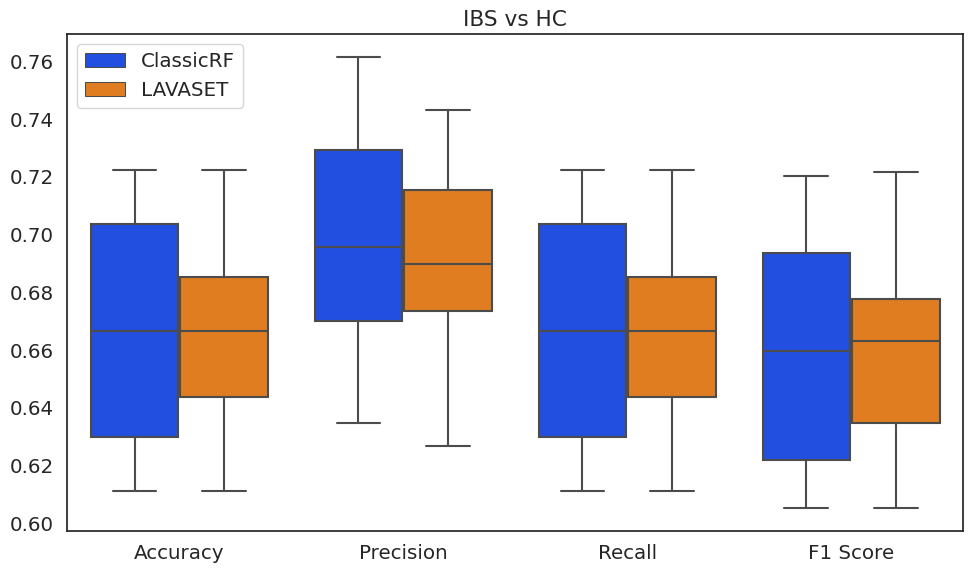

In [208]:
df_concat = pd.concat([classicRF_metrics, lavaset_metrics])
df_concat['Source'] = ['ClassicRF'] * classicRF_metrics.shape[0] + ['LAVASET'] * lavaset_metrics.shape[0]

sns.set_style("white")
sns.set_context('notebook', font_scale=1.3)
sns.set_palette('bright')
plt.figure(figsize=(10, 6))  # Adjust the figure size if needed

df_concat_melted = pd.melt(df_concat, id_vars='Source', value_vars=['Accuracy', 'Precision', 'Recall', 'F1 Score'], var_name='Metric')
sns.boxplot(data=df_concat_melted, x='Metric', y='value', hue='Source')
plt.xlabel('')
plt.ylabel('')
# plt.ylim(0.75, 1)
plt.title('IBS vs HC')

# Display the plot
plt.legend(loc='upper left')

plt.tight_layout()
plt.savefig('uracil-ethanol-metrics.png')
plt.show()

p_values = {}
for column in classicRF_metrics.columns:
    source1_values = classicRF_metrics[column]
    source2_values = lavaset_metrics[column]
    _, p_value = scipy.stats.ttest_rel(source1_values, source2_values)
    p_values[column] = p_value





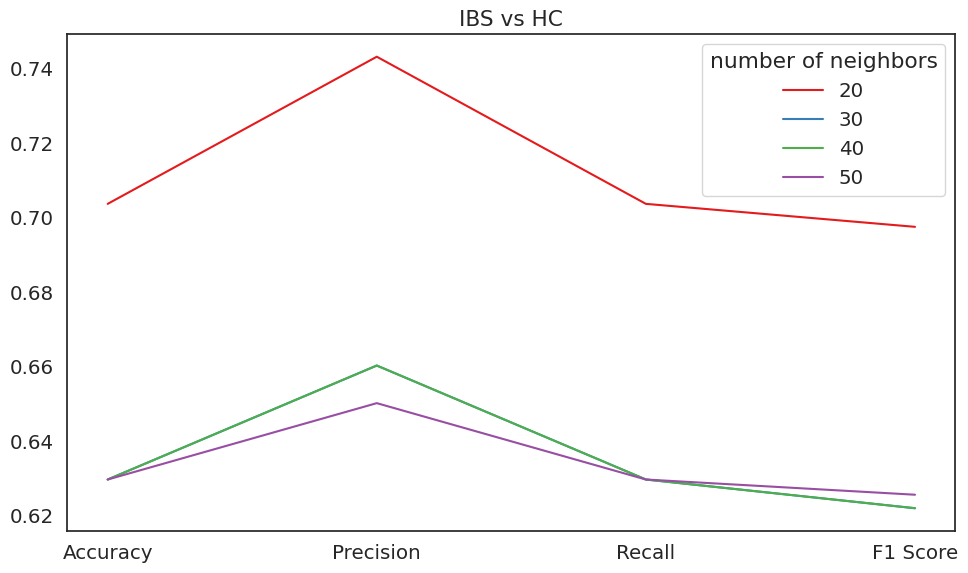

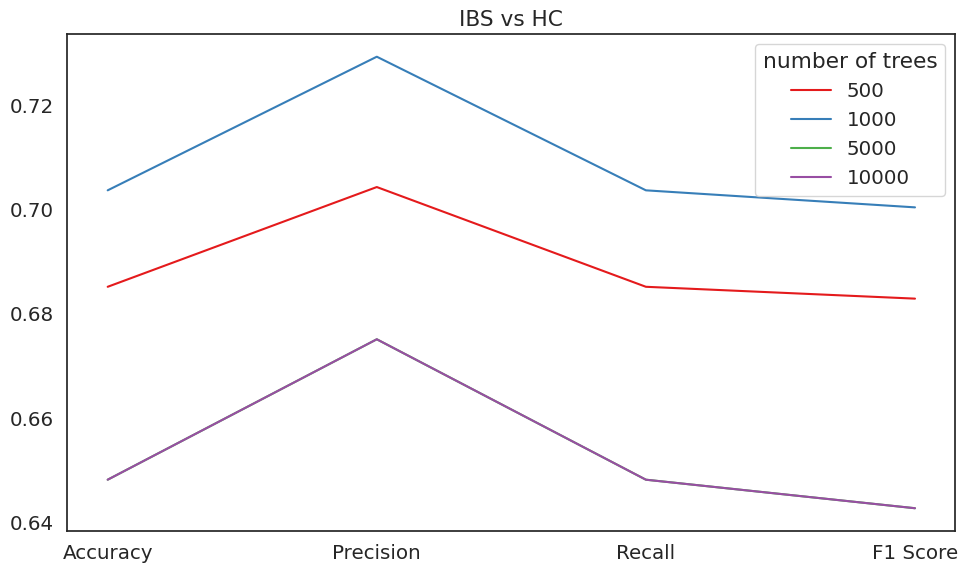

In [209]:
lav_nn = pd.read_csv('lavaset_metrics_1000t{i}nnIBSvsHC.csv')
lav_trees = pd.read_csv('lavaset_metrics_10000t10nnIBSvsHCv2.csv')

sns.set_style("white")
sns.set_context('notebook', font_scale=1.3)
sns.set_palette('bright')
plt.figure(figsize=(10, 6))  # Adjust the figure size if needed

df= pd.melt(lav_nn, id_vars='NumberofNeigh', value_vars=['Accuracy', 'Precision', 'Recall', 'F1 Score'], var_name='Metric')
df2 = pd.melt(lav_trees, id_vars='Random State', value_vars=['Accuracy', 'Precision', 'Recall', 'F1 Score'], var_name='Metric')

sns.lineplot(data=df, x='Metric', y='value', hue='NumberofNeigh', palette='Set1')
plt.xlabel('')
plt.ylabel('')
# plt.ylim(0.75, 1)
plt.title('IBS vs HC')

# Display the plot
plt.legend(loc='upper right', title='number of neighbors')

plt.tight_layout()
plt.show()

sns.set_style("white")
sns.set_context('notebook', font_scale=1.3)
sns.set_palette('bright')
plt.figure(figsize=(10, 6))
sns.lineplot(data=df2, x='Metric', y='value', hue='Random State', palette='Set1')

plt.xlabel('')
plt.ylabel('')
# plt.ylim(0.75, 1)
plt.title('IBS vs HC')

# Display the plot
plt.legend(loc='upper right', title='number of trees')

plt.tight_layout()
plt.show()

In [112]:
def make_importance_plot(results, title): 
    df = pd.DataFrame({'1':nmr_peaks_avg})
    df['gini importance'] = (results.iloc[:, 2].values)/np.sum(results.iloc[:,2]) # normalized by sum of all gini values 

    df['δ'] = x_axis
    fig = px.scatter(df,x=df['δ'],y=df['1'], color='gini importance', title=title)
    fig.show()

def make_importance_plot_static(results, title): 
    df = pd.DataFrame({'1':nmr_peaks_avg[500:1000]})
    df['gini importance'] = (results.iloc[:, 2].values)[500:1000]/np.sum(results.iloc[:,2])*1000 # normalized by sum of all gini values 
    sns.set_palette('bright')

    df['δ'] = x_axis[500:1000]
    # Create scatterplot
    ax = sns.scatterplot(data=df, x=df['δ'], y=df['1'], hue='gini importance', palette='Oranges', s=5)

    norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
    sm = plt.cm.ScalarMappable(cmap="Oranges", norm=norm)
    sm.set_array([])

    ax.invert_xaxis()
    plt.legend('')
    plt.ylabel('avg intensity')
    plt.title(title)
    ax.figure.colorbar(sm)
    plt.show()

def make_countseval_plot(ax, results, title):
    df = pd.DataFrame({'1':nmr_peaks_avg})
    df['times evaluated'] = results.iloc[:, 0].values
    df['δ'] = x_axis
    sns.histplot(ax=ax, data=df['times evaluated'])
    ax.set_title(title)

def make_countsel_plot(ax, results, title):
    df = pd.DataFrame({'1':nmr_peaks_avg})
    df['times selected'] = results.iloc[:, 1].values
    df['δ'] = x_axis
    sns.histplot(ax=ax, data=df['times selected'])
    ax.set_title(title)
    

LAVASET 
- time for 100 trees: 112.33406901359558 sec<br>
- accuracy: 0.7777777777777778, <br> 0.8148148148148148 ([0.0 1.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 0.0 0.0 1.0 0.0 0.0 1.0 0.0 0.0 1.0
 0.0 1.0 0.0 0.0 1.0 0.0 1.0 0.0 0.0 0.0 1.0 0.0 1.0 0.0 1.0 0.0 1.0 0.0
 0.0 0.0 1.0 0.0 0.0 0.0 1.0 1.0 1.0 0.0 0.0 0.0 1.0 1.0 0.0 0.0 1.0 1.0]), random_state=15, 25 <br>
 0.8703703703703703 random_state = 90
- y_pred: [1.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 1.0 1.0 0.0 1.0 0.0 0.0 1.0 1.0 1.0
 1.0 0.0 1.0 1.0 0.0 1.0 0.0 1.0 1.0 1.0 0.0 1.0 0.0 1.0 0.0 1.0 0.0 1.0
 1.0 1.0 1.0 1.0 0.0 1.0 0.0 0.0 0.0 1.0 1.0 1.0 0.0 0.0 1.0 0.0 0.0 0.0]


classicRF 
- time for 100 trees: 6.485620737075806
- accuracy: 0.7407407407407407 random_state=15, 25 <br>
0.8333333333333334 random_state = 90
- y_pred: [1 0 1 1 1 1 1 0 0 1 1 0 0 1 0 1 1 0 1 0 1 1 0 1 0 1 1 1 0 1 0 1 0 1 0 1 1
 1 0 1 0 1 0 0 0 1 1 1 0 0 1 0 1 0], [0 1 0 0 0 0 0 1 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 1 1 0 0 0 1 0 1 0 1 0 1 0 0
 0 1 0 1 0 1 1 1 0 0 0 1 1 0 1 0 1]


In [82]:
# in the simulated dataset random state 70 has the best accuracies in both so picking this to show importances 

classicRF_impo_100t10nn = pd.read_csv('classicRF_feature_impo_100t10nnIBSvsHC_random_state17v2.csv').iloc[:, 1:]
lavaset_impo_100t10nn = pd.read_csv('lavaset_feature_impo_100t10nnIBSvsHC_random_state17v2.csv').iloc[:, 1:]

classicRF_impo_1000t10nn = pd.read_csv('classicRF_feature_impo_1000t10nnIBSvsHC_random_state10v2.csv').iloc[:, 1:]
lavaset_impo_1000t10nn = pd.read_csv('lavaset_feature_impo_1000t10nnIBSvsHC_random_state10v2.csv').iloc[:, 1:]


In [83]:
classicRF_impo_100t10nn.loc[:, 'gini_normalized'] = classicRF_impo_100t10nn.iloc[:, 2].values/np.sum(classicRF_impo_100t10nn.iloc[:,2])*100
lavaset_impo_100t10nn.loc[:, 'gini_normalized'] = lavaset_impo_100t10nn.iloc[:, 2].values/np.sum(lavaset_impo_100t10nn.iloc[:,2])*100
lavaset_impo_100t10nn.loc[:, 'gini_normalized'].max()


0.08386678848417588

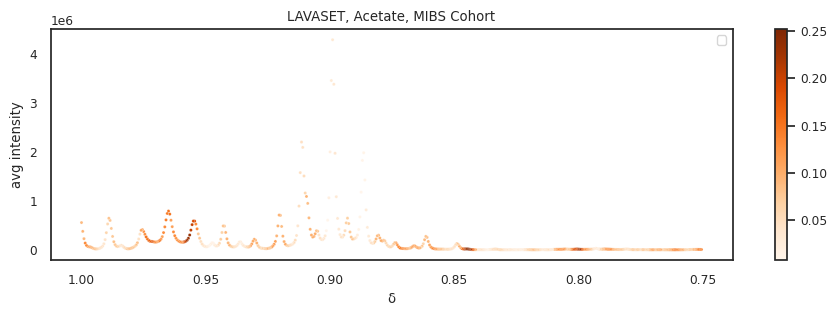

In [130]:

sns.set_style("white")
sns.set_context('notebook', font_scale=.8)
sns.set_palette('bright')
plt.figure(figsize=(11, 3)) 
df = pd.DataFrame({'1':nmr_peaks_avg[500:1000]})
df['gini importance'] = (lavaset_impo_1000t10nn.iloc[:, 2].values)[500:1000]/np.sum(lavaset_impo_1000t10nn.iloc[:,2])*1000 # normalized by sum of all gini values 
sns.set_palette('bright')

df['δ'] = x_axis[500:1000]
    # Create scatterplot
ax = sns.scatterplot(data=df, x=df['δ'], y=df['1'], hue='gini importance', palette='Oranges', s=5)

norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="Oranges", norm=norm)
sm.set_array([])

ax.invert_xaxis()
plt.legend('')
plt.ylabel('avg intensity')
plt.title('LAVASET, Acetate, MIBS Cohort')
ax.figure.colorbar(sm)
plt.show()

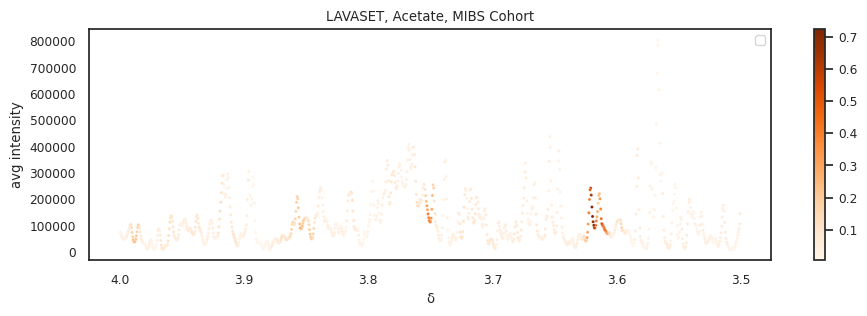

In [128]:
sns.set_style("white")
sns.set_context('notebook', font_scale=.8)
sns.set_palette('bright')
plt.figure(figsize=(11, 3)) 
df = pd.DataFrame({'1':nmr_peaks_avg[6000:7000]})
df['gini importance'] = (lavaset_impo_1000t10nn.iloc[:, 2].values)[6000:7000]/np.sum(lavaset_impo_1000t10nn.iloc[:,2])*1000 # normalized by sum of all gini values 
sns.set_palette('bright')

df['δ'] = x_axis[6000:7000]
    # Create scatterplot
ax = sns.scatterplot(data=df, x=df['δ'], y=df['1'], hue='gini importance', palette='Oranges', s=5)

norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="Oranges", norm=norm)
sm.set_array([])

ax.invert_xaxis()
plt.legend('')
plt.ylabel('avg intensity')
plt.title('LAVASET, Acetate, MIBS Cohort')
ax.figure.colorbar(sm)
plt.show()

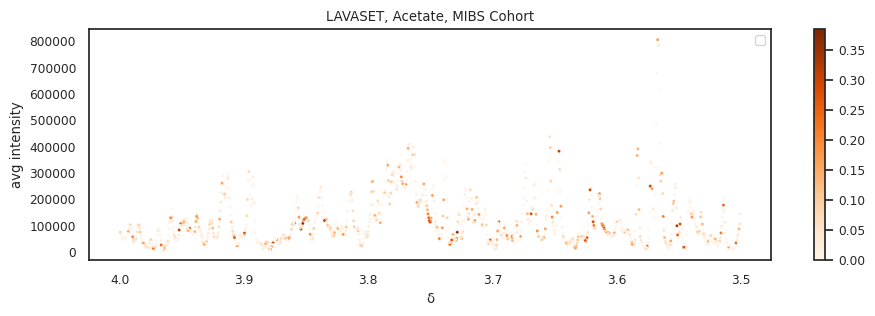

In [129]:
sns.set_style("white")
sns.set_context('notebook', font_scale=.8)
sns.set_palette('bright')
plt.figure(figsize=(11, 3)) 
df = pd.DataFrame({'1':nmr_peaks_avg[6000:7000]})
df['gini importance'] = (classicRF_impo_1000t10nn.iloc[:, 2].values)[6000:7000]/np.sum(classicRF_impo_1000t10nn.iloc[:,2])*1000 # normalized by sum of all gini values 
sns.set_palette('bright')

df['δ'] = x_axis[6000:7000]
    # Create scatterplot
ax = sns.scatterplot(data=df, x=df['δ'], y=df['1'], hue='gini importance', palette='Oranges', s=5)

norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="Oranges", norm=norm)
sm.set_array([])

ax.invert_xaxis()
plt.legend('')
plt.ylabel('avg intensity')
plt.title('LAVASET, Acetate, MIBS Cohort')
ax.figure.colorbar(sm)
plt.show()

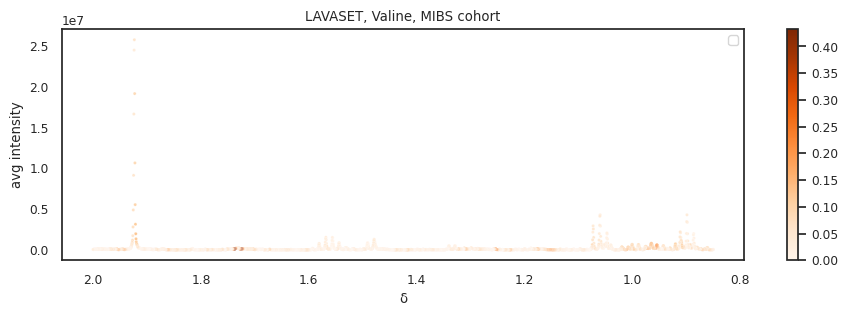

In [115]:
sns.set_style("white")
sns.set_context('notebook', font_scale=.8)
sns.set_palette('bright')
plt.figure(figsize=(11, 3)) 
make_importance_plot_static(lavaset_impo_1000t10nn, 'LAVASET, Valine, MIBS cohort')
# sns.set_style("white")
# sns.set_context('notebook', font_scale=.8)
# sns.set_palette('bright')
# plt.figure(figsize=(11, 3)) 
# make_importance_plot_static(classicRF_impo_1000t10nn, 'ClassicRF, Valine, MIBS cohort')

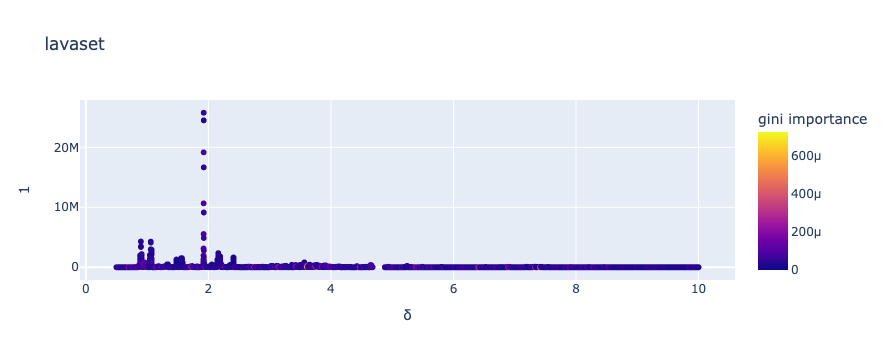

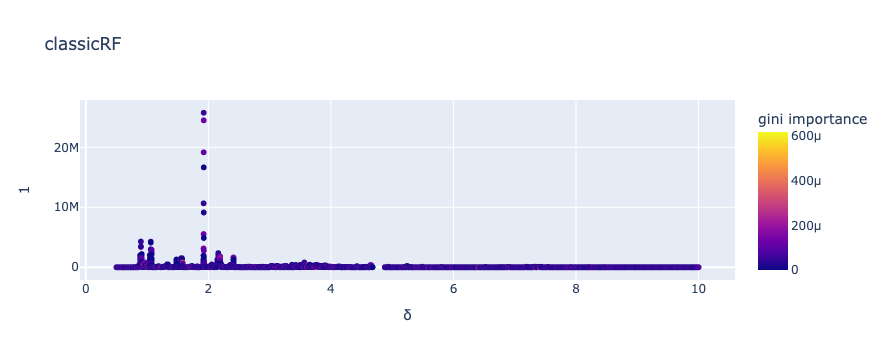

In [85]:
make_importance_plot(lavaset_impo_1000t10nn, 'lavaset')
make_importance_plot(classicRF_impo_1000t10nn, 'classicRF')

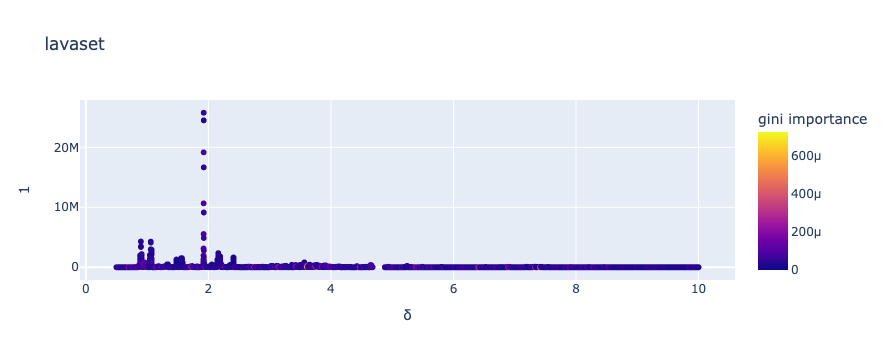

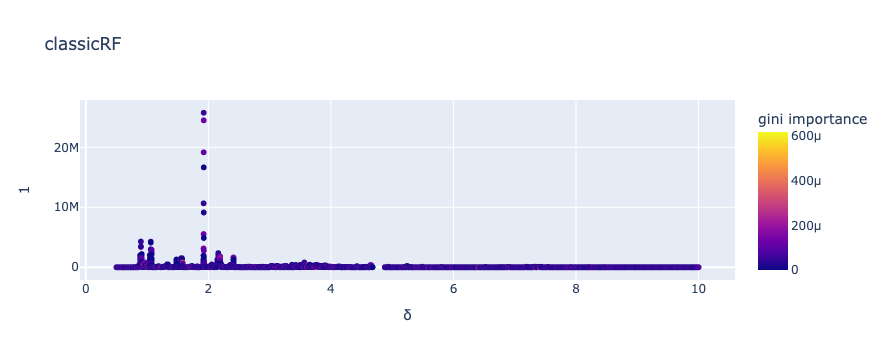

In [20]:
make_importance_plot(lavaset_impo_1000t10nn, 'lavaset')
make_importance_plot(classicRF_impo_1000t10nn, 'classicRF')

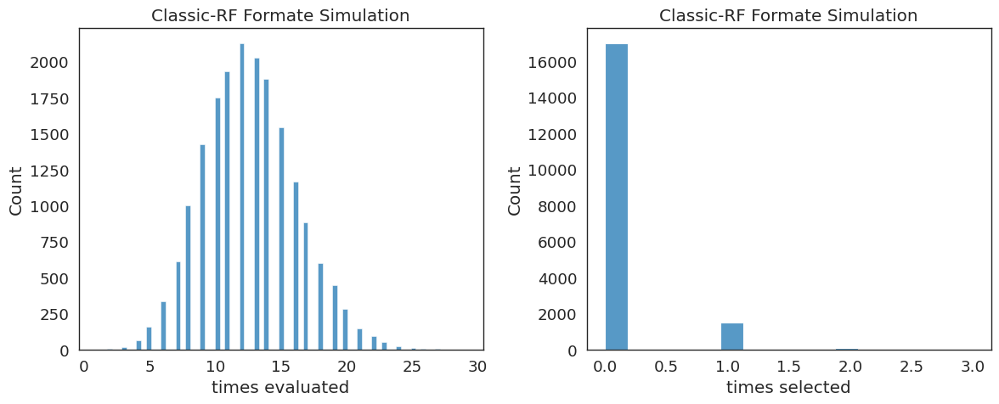

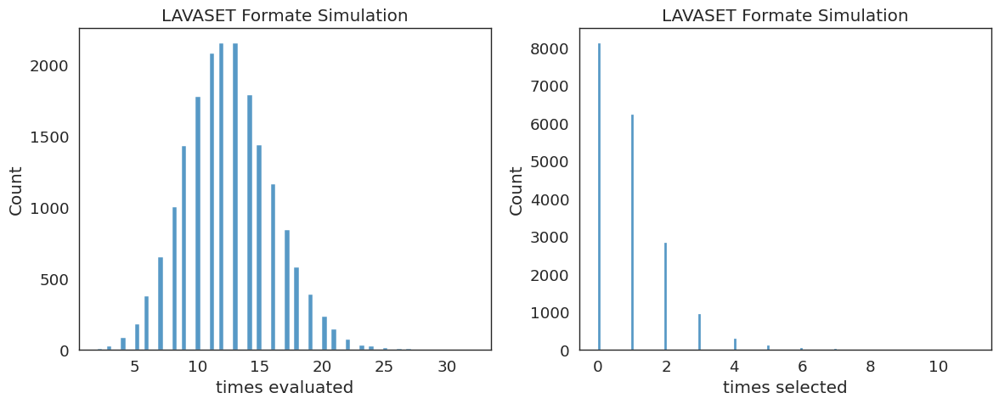

In [8]:

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
make_countseval_plot(axes[0], classicRF_impo_100t10nn, "Classic-RF Formate Simulation")
make_countsel_plot(axes[1], classicRF_impo_100t10nn, "Classic-RF Formate Simulation")
plt.tight_layout()
plt.show()
# fig, axes = plt.subplots(1, 2, figsize=(12, 5))
# make_countseval_plot(axes[0], lavaset_impo_100t10nn3, "LAVASET Formate Simulation")
# make_countsel_plot(axes[1], lavaset_impo_100t10nn3, "LAVASET Formate Simulation")
# plt.tight_layout()
# plt.show()

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
make_countseval_plot(axes[0], lavaset_impo_100t10nn, "LAVASET Formate Simulation")
make_countsel_plot(axes[1], lavaset_impo_100t10nn, "LAVASET Formate Simulation")
plt.tight_layout()
plt.show()


## Paper Figures

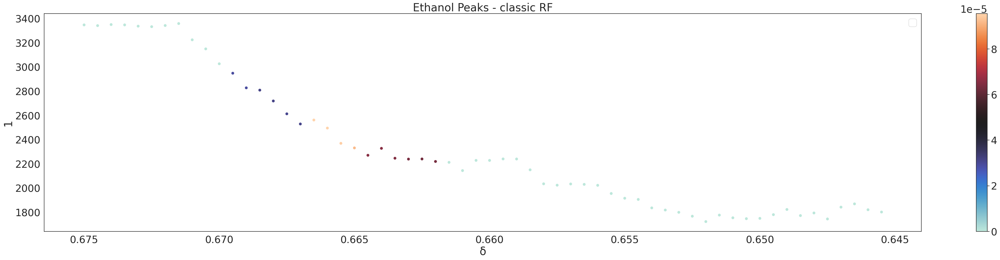

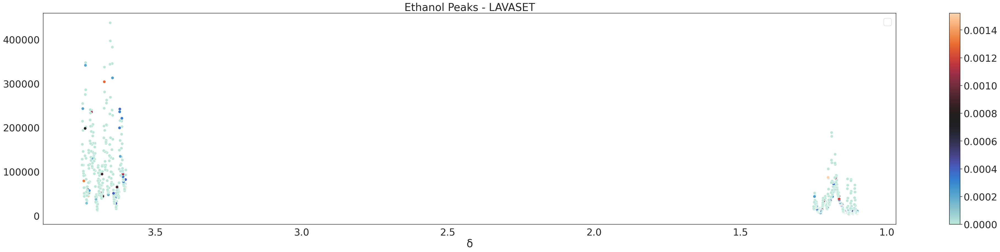

In [48]:
frange = range(1200,1500)
# df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
# # df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
# # df['gini importance'] = simgroups_100t10nn_lavaset.iloc[:, 2].values[frange]
# df['gini importance'] = (simgroups_100t10nn_lavaset.iloc[:, 2].values/np.sum(simgroups_100t10nn_lavaset.iloc[:,2]))[frange] # normalized by sum of all gini values 
# df['gini importance'] = df['gini importance']*100
# df['δ'] = x_axis[frange]

# # df = df[df['3']!=0]

# plt.figure(figsize=(50, 10))
# sns.set(font_scale=2.3,  style='white')
# # ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
# ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='magma_r', s=60)
# norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
# sm = plt.cm.ScalarMappable(cmap="magma_r", norm=norm)
# sm.set_array([])
# ax.invert_xaxis()
# plt.legend('')
# # ax.get_legend()
# ax.figure.colorbar(sm)

plt.figure(figsize=(50, 10))
sns.set(font_scale=2.3,  style='white')

franges = [range(290,350)]  # ethanol ranges

dfs = []  # List to hold dataframes

for frange in franges:
    df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
    df['gini importance'] = (lavaset_impo_100t10nn.iloc[:, 2].values/np.sum(lavaset_impo_100t10nn.iloc[:,2]))[frange]
    df['δ'] = x_axis[frange]
    dfs.append(df)

# Concatenate all dataframes
df_all = pd.concat(dfs, ignore_index=True)

# Create scatterplot
ax = sns.scatterplot(data=df_all, x=df_all['δ'], y=df_all['1'], hue='gini importance', palette='icefire', s=60)

norm = plt.Normalize(df_all['gini importance'].min(), df_all['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
sm.set_array([])

ax.invert_xaxis()
plt.legend('')
plt.title('Ethanol Peaks - classic RF')
ax.figure.colorbar(sm)


plt.figure(figsize=(50, 10))
sns.set(font_scale=2.3,  style='white')

franges = [range(1200,1500), range(6200,6500)]  # ethanol ranges

dfs = []  # List to hold dataframes

for frange in franges:
    df = pd.DataFrame({'':nmr_peaks_avg[frange]})
    df['gini importance'] = (classicRF_impo_100t10nn.iloc[:, 2].values/np.sum(classicRF_impo_100t10nn.iloc[:,2]))[frange]
    df['δ'] = x_axis[frange]
    dfs.append(df)

# Concatenate all dataframes
df_all = pd.concat(dfs, ignore_index=True)


# Create scatterplot
ax = sns.scatterplot(data=df_all, x=df_all['δ'], y=df_all[''], hue='gini importance', palette='icefire', s=60)

norm = plt.Normalize(df_all['gini importance'].min(), df_all['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
sm.set_array([])

ax.invert_xaxis()
plt.legend('')
plt.title('Ethanol Peaks - LAVASET')
ax.figure.colorbar(sm)



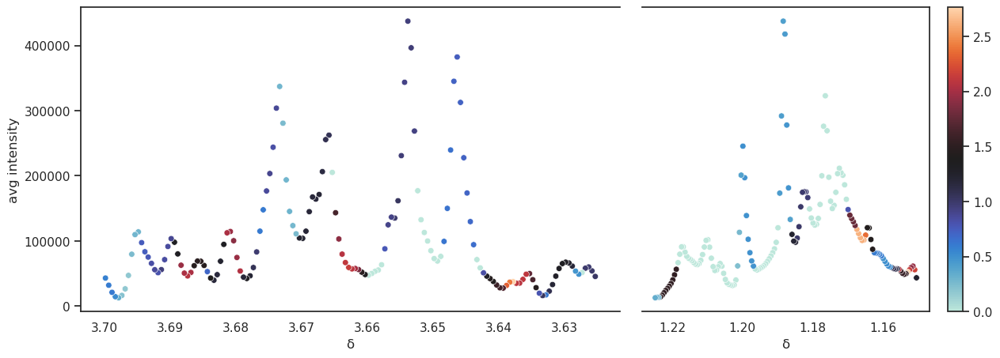

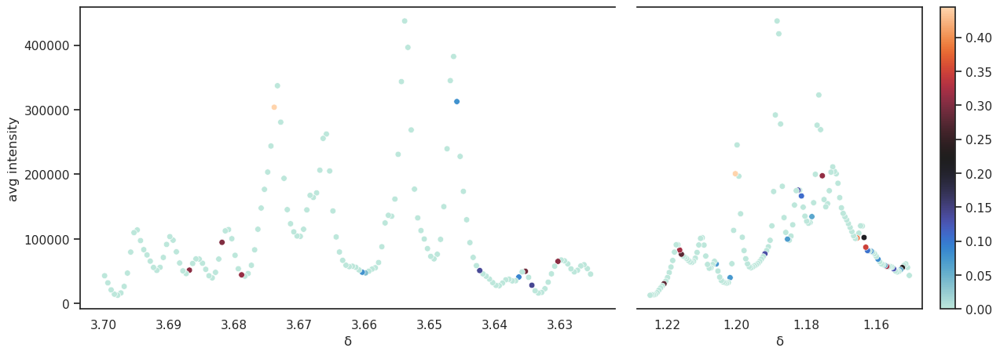

In [13]:
import matplotlib.gridspec as gridspec
# ax[1].set_ylabel('')

# Prepare your data
franges = [range(6285,6369), range(1345,1409)]  # ethanol ranges
franges = [range(6250,6400), range(1300,1450)]
dfs = []  

for frange in franges:
    df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
    df['gini importance'] = lavaset_impo_100t10nn.iloc[:, 2].values[frange]
    df['δ'] = x_axis[frange]
    dfs.append(df)

# Concatenate all dataframes
df_all = pd.concat(dfs, ignore_index=True)
sns.set(font_scale=1,  style='white')

fig = plt.figure(figsize=(15,5))
gs = gridspec.GridSpec(1, 2, width_ratios=[30, 20]) 

ax = []
for i in range(2):
    ax.append(plt.subplot(gs[i]))
    sns.scatterplot(data=dfs[i], x=dfs[i]['δ'], y=dfs[i]['1'], hue='gini importance', palette='icefire', s=30, ax=ax[i], legend=False)
    norm = plt.Normalize(df_all['gini importance'].min(), df_all['gini importance'].max())
    sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
    sm.set_array([])
    ax[i].invert_xaxis()

# Hide the spines between ax[0] and ax[1]
ax[0].spines['right'].set_visible(False)
ax[1].spines['left'].set_visible(False)
ax[0].yaxis.tick_left()
ax[0].tick_params(labelright=False)
ax[1].tick_params(labelright=False, labelleft=False)
ax[0].set_ylabel('avg intensity')
ax[1].set_ylabel('')
ax[1].figure.colorbar(sm)

# Hide y-axis of the second subplot
plt.subplots_adjust(wspace=0.05)
plt.show()

dfs = []  
for frange in franges:
    df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
    df['gini importance'] = classicRF_impo_100t10nn.iloc[:, 2].values[frange]
    df['δ'] = x_axis[frange]
    dfs.append(df)

# Concatenate all dataframes
df_all = pd.concat(dfs, ignore_index=True)
sns.set(font_scale=1,  style='white')

fig = plt.figure(figsize=(15,5))
gs = gridspec.GridSpec(1, 2, width_ratios=[30, 20]) 

ax = []
for i in range(2):
    ax.append(plt.subplot(gs[i]))
    sns.scatterplot(data=dfs[i], x=dfs[i]['δ'], y=dfs[i]['1'], hue='gini importance', palette='icefire', s=30, ax=ax[i], legend=False)
    norm = plt.Normalize(df_all['gini importance'].min(), df_all['gini importance'].max())
    sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
    sm.set_array([])
    ax[i].invert_xaxis()

# Hide the spines between ax[0] and ax[1]
ax[0].spines['right'].set_visible(False)
ax[1].spines['left'].set_visible(False)
ax[0].yaxis.tick_left()
ax[0].tick_params(labelright=False)
ax[1].tick_params(labelright=False, labelleft=False)
ax[0].set_ylabel('avg intensity')
ax[1].set_ylabel('')
ax[1].figure.colorbar(sm)

# Hide y-axis of the second subplot
plt.subplots_adjust(wspace=0.05)
plt.show()


In [106]:
classicRF_impo_100t10nn.iloc[:, 2].max()


0.8571428571428571

In [136]:
nmr_peaks_avg[range(6000,7000)]

3.5003    145790.875306
3.5008    106650.799149
3.5013     87152.392103
3.5018     74821.568976
3.5023     63455.160096
              ...      
3.9978     49913.099561
3.9983     55191.750068
3.9988     62886.415591
3.9993     70247.394801
3.9998     74808.278405
Length: 1000, dtype: float64

In [139]:
nmr_peaks_avg[range(2000,3000)]

1.5004    35259.809317
1.5009    26028.859577
1.5014    20812.583715
1.5019    18316.056885
1.5024    17292.972377
              ...     
1.9979    45229.390337
1.9984    41806.036134
1.9989    37313.854991
1.9994    34545.775745
1.9999    34952.979721
Length: 1000, dtype: float64

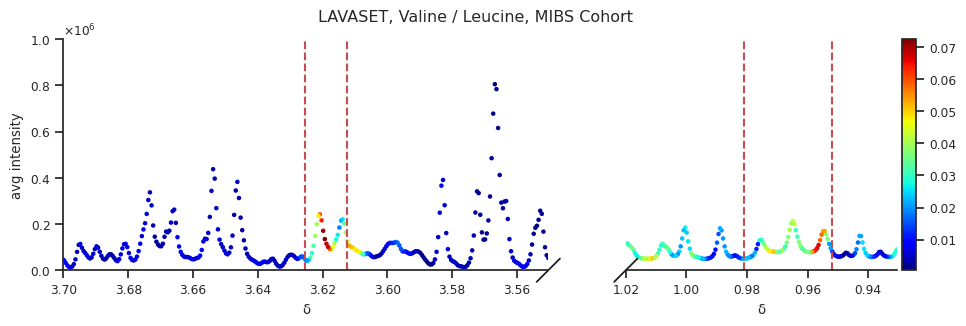

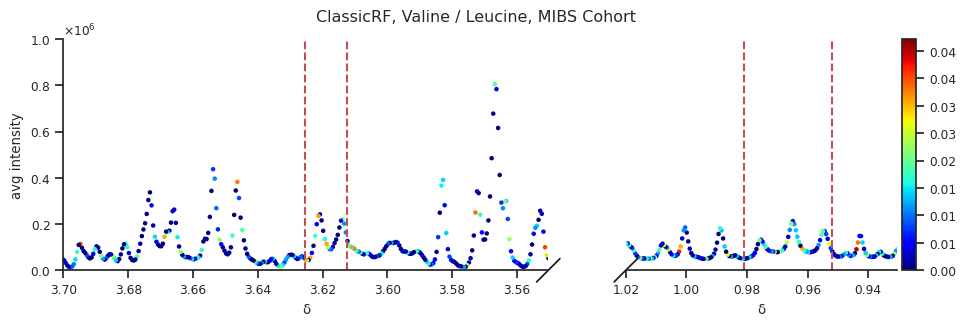

In [166]:
from brokenaxes import brokenaxes
import matplotlib.ticker as ticker

def make_broken_axes_plot(impo_df, frange, xlims, title, hor1, hor2, hor3, hor4):
    sns.set(font_scale=.8,  style='white')
    fig = plt.figure(figsize=(11,3))
    dfs = []  
    for frange in franges:
        df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
        df['gini importance'] = impo_df.iloc[:, 2].values[frange]/np.sum(impo_df.iloc[:,2])*100
        # df['gini importance'] = impo_df['gini_normalized'][frange]
        df['δ'] = x_axis[frange]
        dfs.append(df)

    # Concatenate all dataframes
    df_all = pd.concat(dfs, ignore_index=True)

    # Create broken x-axis
    bax = brokenaxes(xlims=xlims, hspace=0.001)
    for df in dfs:
        bax.scatter(df['δ'], df['1'], c=df['gini importance'], cmap="jet", s=5)
        norm = plt.Normalize(df_all['gini importance'].min(), df_all['gini importance'].max())
        sm = plt.cm.ScalarMappable(cmap="jet", norm=norm)
        sm.set_array([])

    for ax in bax.axs:
        ax.axvline(x=hor1, color='r', linestyle='--') 
        ax.axvline(x=hor2, color='r', linestyle='--')
        ax.axvline(x=hor3, color='r', linestyle='--')
        ax.axvline(x=hor4, color='r', linestyle='--')
        if ax != bax.axs[0]:  # if not the last subplot
            ax.set_yticklabels([])  # remove y labels

    # set y label for the last subplot
    bax.axs[0].set_ylabel('avg intensity')
    bax.axs[0].set_ylim(0, 1000000)
    bax.axs[0].set_xlabel('δ')
    bax.axs[-1].set_xlabel('δ')
    formatter = ticker.ScalarFormatter(useOffset=False, useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-3, 3))
    bax.axs[0].yaxis.set_major_formatter(formatter)

    formatter = ticker.FormatStrFormatter('%.1f')  # Set decimal precision to 1

    divider = make_axes_locatable(bax.axs[1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(sm, cax=cax, orientation='vertical')
    cax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))  # Set decimal precision to 1

    bax.invert_xaxis()
    fig.suptitle(title)
    # plt.savefig('ethanol-uracil-peaks4.png')

    plt.show()

franges = [range(500,1040), range(6000,7000)]  # ethanol ranges

make_broken_axes_plot(lavaset_impo_1000t10nn, franges, ((3.5503, 3.700), (0.9304, 1.020)), 'LAVASET, Valine / Leucine, MIBS Cohort', 3.612342, 3.625341, 0.951944, 0.980943)
make_broken_axes_plot(classicRF_impo_1000t10nn, franges, ((3.5503, 3.700), (0.9304, 1.020)), 'ClassicRF, Valine / Leucine, MIBS Cohort', 3.612342, 3.625341, 0.951944,0.980943)

# franges = [range(10100,10400), range(13400,13800)] # uracil 
# make_broken_axes_plot(lavaset_impo_1000t10nn, franges, ((7.500, 7.600), (5.750, 5.850)), 'LAVASET, Uracil, Simulated Dataset', 5.798258, 5.819757, 7.532191, 7.554690)
# make_broken_axes_plot(classicRF_impo_1000t10nn, franges, ((7.500, 7.600), (5.750, 5.850)), 'ClassicRF, Uracil, Simulated Dataset', 5.798258,5.819757, 7.532191, 7.554690)




In [28]:
display(clas_eth)
lav_eth

,0,1,2,gini_normalized
1346,10.0,0.0,0.000000,0.000000
1347,10.0,0.0,0.000000,0.000000
1348,12.0,0.0,0.000000,0.000000
1349,14.0,0.0,0.000000,0.000000
1350,11.0,0.0,0.000000,0.000000
...,...,...,...,...
6364,15.0,0.0,0.000000,0.000000
6365,17.0,1.0,0.046485,0.016910
6366,10.0,0.0,0.000000,0.000000
6367,13.0,1.0,0.042025,0.015287


,0,1,2,gini_normalized
1346,8.0,0.0,0.000000,0.000000
1347,11.0,0.0,0.000000,0.000000
1348,9.0,0.0,0.000000,0.000000
1349,9.0,1.0,0.610908,0.006173
1350,9.0,1.0,0.422114,0.004265
...,...,...,...,...
6364,9.0,2.0,1.210964,0.012236
6365,14.0,2.0,1.286353,0.012998
6366,9.0,2.0,1.333488,0.013475
6367,8.0,2.0,1.371160,0.013855


In [128]:
# 244 points in total 
lav_eth = lavaset_impo_100t10nn.iloc[ethanol_indeces[:50], :]
clas_eth = classicRF_impo_100t10nn.iloc[ethanol_indeces[:50], :]

lav_ur = lavaset_impo_100t10nn.iloc[uracil_indeces, :]
clas_ur = classicRF_impo_100t10nn.iloc[uracil_indeces, :]
display(lav_eth.shape, lav_ur.shape)
display(lav_eth[lav_eth.iloc[:, 1] != 0].shape) # number of points selected for split within the peaks
display(clas_eth[clas_eth.iloc[:, 1] != 0].shape)
(60/144)*100
display(lav_ur[lav_ur.iloc[:, 1] != 0].shape) # number of points selected for split within the peaks
display(clas_ur[clas_ur.iloc[:, 1] != 0].shape)

(50, 4)

(90, 4)

(47, 4)

(8, 4)

(90, 4)

(36, 4)

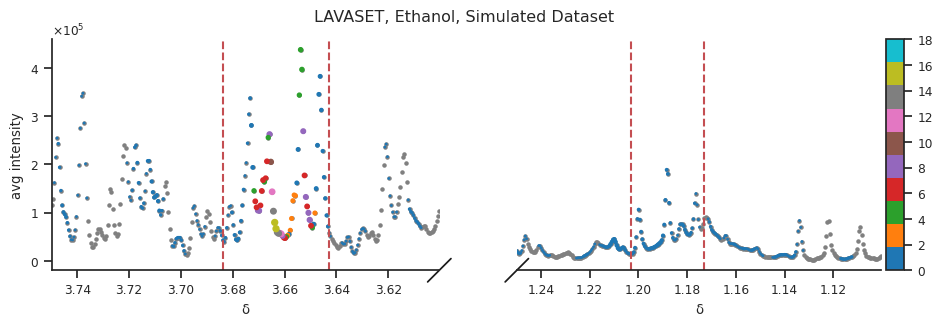

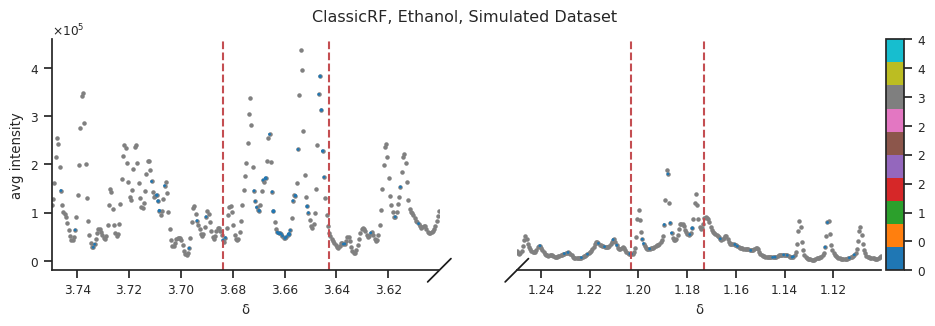

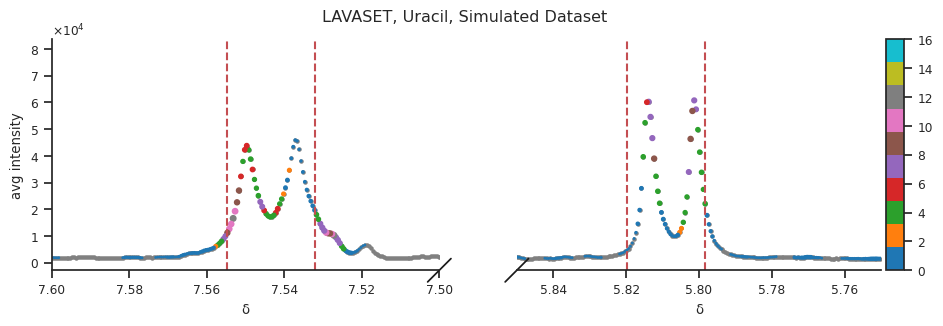

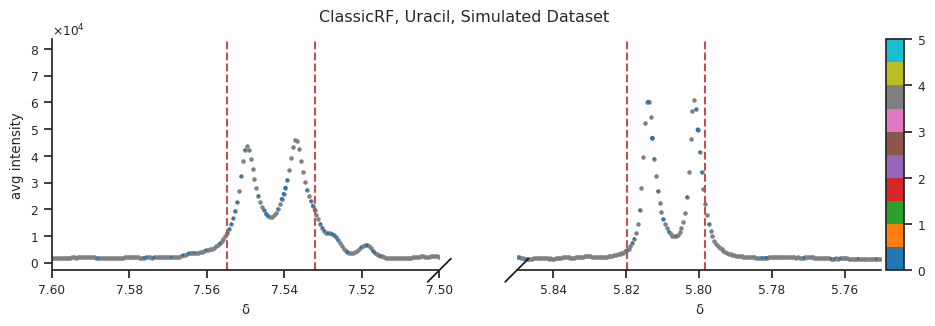

In [151]:
from brokenaxes import brokenaxes
import matplotlib.ticker as ticker

def make_broken_axes_plot_eval(impo_df, frange, xlims, title, hor1, hor2, hor3, hor4):
    sns.set(font_scale=.8,  style='white')
    fig = plt.figure(figsize=(11,3))
    dfs = []  
    for frange in franges:
        df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
        df['gini importance'] = impo_df.iloc[:, 1].values[frange]#/np.sum(impo_df.iloc[:,1])*100
        # df['gini importance'] = impo_df['gini_normalized'][frange]
        df['δ'] = x_axis[frange]
        dfs.append(df)

    # Concatenate all dataframes
    df_all = pd.concat(dfs, ignore_index=True)

    # Create broken x-axis
    bax = brokenaxes(xlims=xlims, hspace=0.001)
    for df in dfs:
        sizes = df['gini importance']  # Assign the sizes based on the 'gini importance' column
        bax.scatter(df['δ'], df['1'], c='gray', s=5)
        bax.scatter(df['δ'], df['1'], c=df['gini importance'], cmap='tab10', s=sizes, vmin=5, vmax=20)
        norm = plt.Normalize(df_all['gini importance'].min(), df_all['gini importance'].max())
        sm = plt.cm.ScalarMappable(cmap="tab10", norm=norm)
        sm.set_array([])

    for ax in bax.axs:
        ax.axvline(x=hor1, color='r', linestyle='--') 
        ax.axvline(x=hor2, color='r', linestyle='--')
        ax.axvline(x=hor3, color='r', linestyle='--')
        ax.axvline(x=hor4, color='r', linestyle='--')
        if ax != bax.axs[0]:  # if not the last subplot
            ax.set_yticklabels([])  # remove y labels

    # set y label for the last subplot
    bax.axs[0].set_ylabel('avg intensity')
    bax.axs[0].set_xlabel('δ')
    bax.axs[-1].set_xlabel('δ')
    formatter = ticker.ScalarFormatter(useOffset=False, useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-3, 3))
    bax.axs[0].yaxis.set_major_formatter(formatter)

    formatter = ticker.FormatStrFormatter('%.1f')  # Set decimal precision to 1

    divider = make_axes_locatable(bax.axs[1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(sm, cax=cax, orientation='vertical')
    cax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.0f'))  # Set decimal precision to 1

    bax.invert_xaxis()
    fig.suptitle(title)
    # plt.savefig('ethanol-uracil-peaks4.png')

    plt.show()

franges = [range(1200,1500), range(6200,6500)]  # ethanol ranges

make_broken_axes_plot_eval(lavaset_impo_100t10nn, franges, ((3.6003, 3.7498), (1.1004, 1.2499)), 'LAVASET, Ethanol, Simulated Dataset', 1.172936, 3.683839, 1.202935, 3.642841)
make_broken_axes_plot_eval(classicRF_impo_100t10nn, franges, ((3.6003, 3.7498), (1.1004, 1.2499)), 'ClassicRF, Ethanol, Simulated Dataset', 1.172936, 3.683839, 1.202935, 3.642841)

franges = [range(10100,10400), range(13400,13800)] # uracil 
make_broken_axes_plot_eval(lavaset_impo_100t10nn, franges, ((7.500, 7.600), (5.750, 5.850)), 'LAVASET, Uracil, Simulated Dataset', 5.798258, 5.819757, 7.532191, 7.554690)
make_broken_axes_plot_eval(classicRF_impo_100t10nn, franges, ((7.500, 7.600), (5.750, 5.850)), 'ClassicRF, Uracil, Simulated Dataset', 5.798258,5.819757, 7.532191, 7.554690)




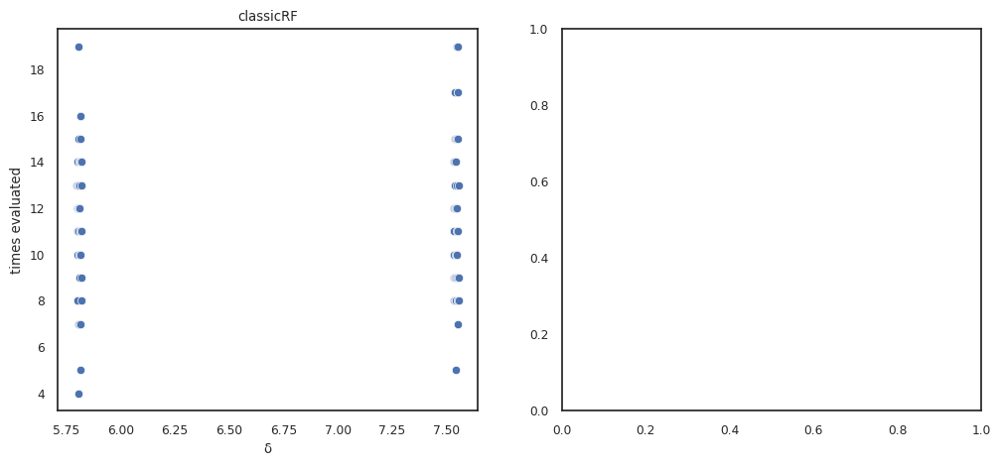

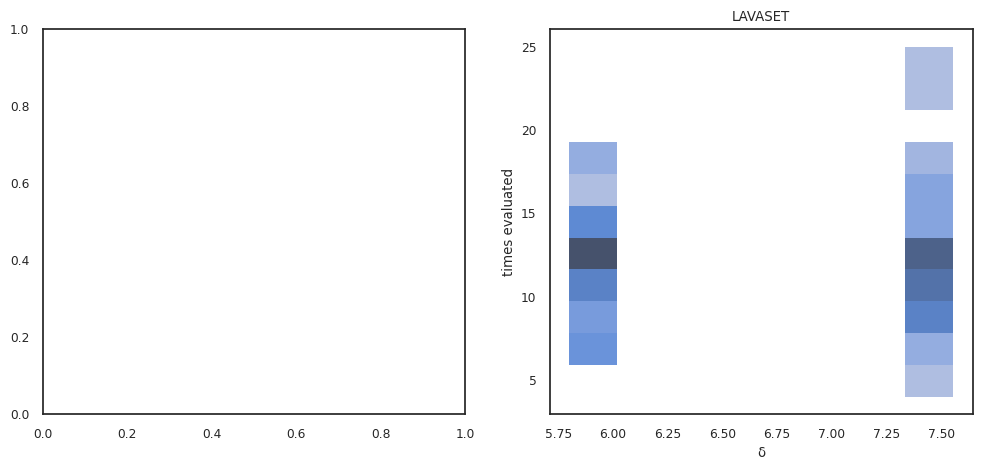

(90, 5)

In [130]:
sns.set(font_scale=.8,  style='white')

df = pd.DataFrame({'1':nmr_peaks_avg[uracil_indeces]/1000})
df['δ'] = x_axis[uracil_indeces]
df['times evaluated'] = clas_ur.iloc[:, 0].to_list()
df['times selected']= clas_ur.iloc[:, 1].to_list()
df['gini importance']= clas_ur.iloc[:, 3].to_list()

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.scatterplot(ax=axes[0], data=df, x=df['δ'], y=df['times evaluated'])
axes[0].set_title('classicRF')  # Title for first plot
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
df = pd.DataFrame({'1':nmr_peaks_avg[uracil_indeces]/1000})
df['δ'] = x_axis[uracil_indeces]
df['times evaluated'] = lav_ur.iloc[:, 0].to_list()
df['times selected']= lav_ur.iloc[:, 1].to_list()
df['gini importance']= lav_ur.iloc[:, 3].to_list()

sns.histplot(ax=axes[1], data=df, x=df['δ'], y=df['times evaluated'])
axes[1].set_title('LAVASET')  # Title for first plot
plt.show()
df.shape







In [23]:
cmr_importances = pd.read_csv('lavaset_feature_impo_10000t100nnHCMvsHCtest_random_state10.csv')


<AxesSubplot:xlabel='0', ylabel='Count'>

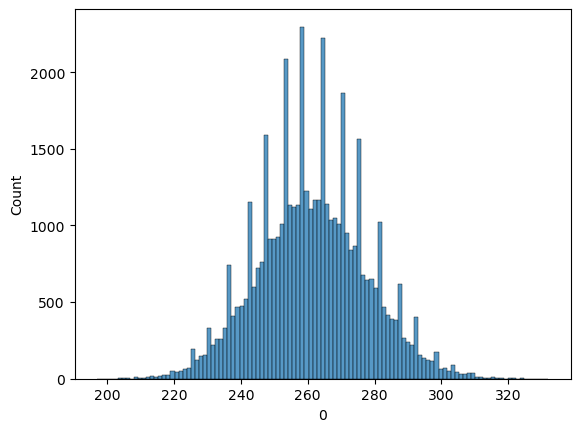

In [26]:
sns.histplot(cmr_importances.iloc[:, 1])

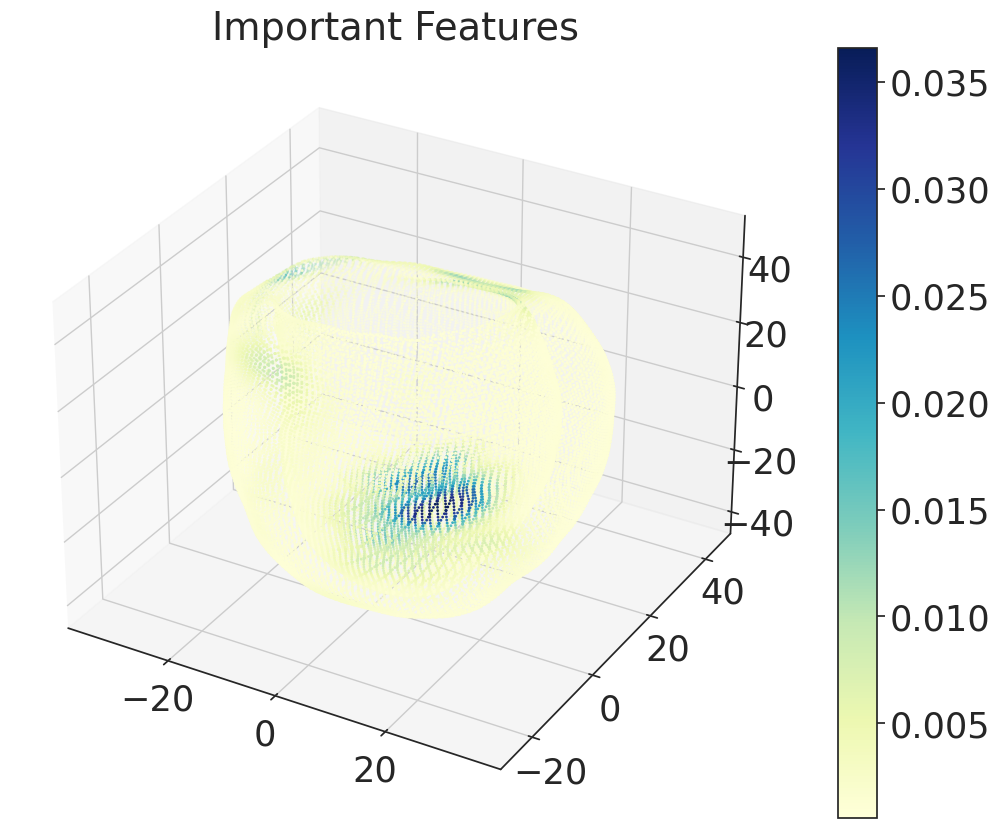

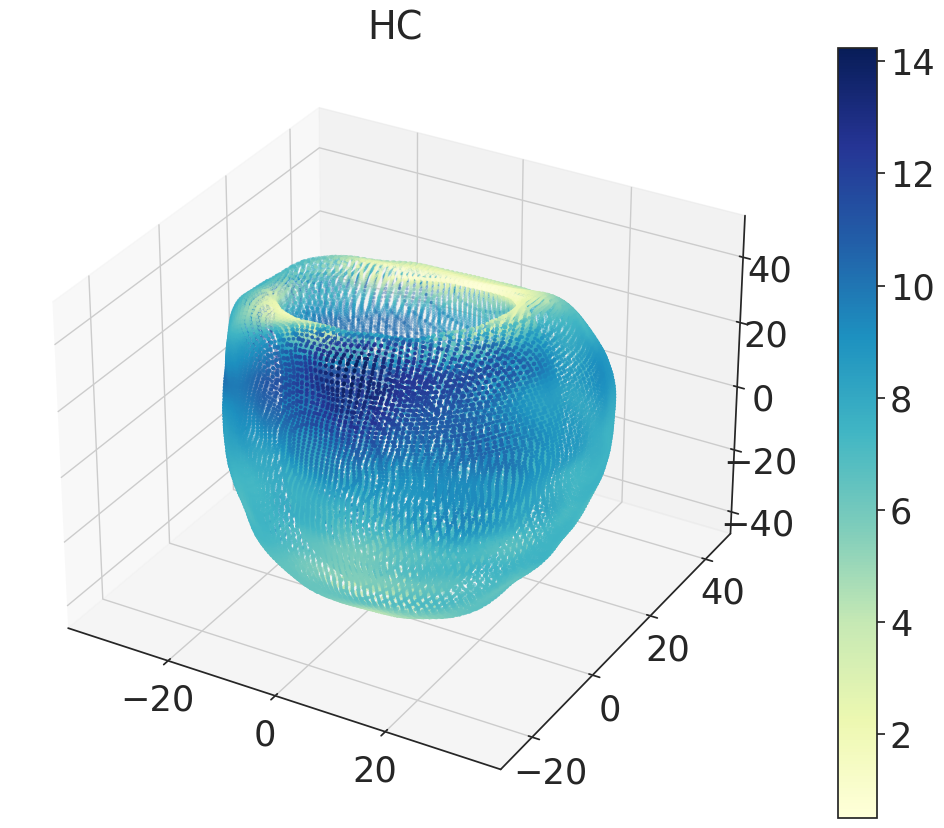

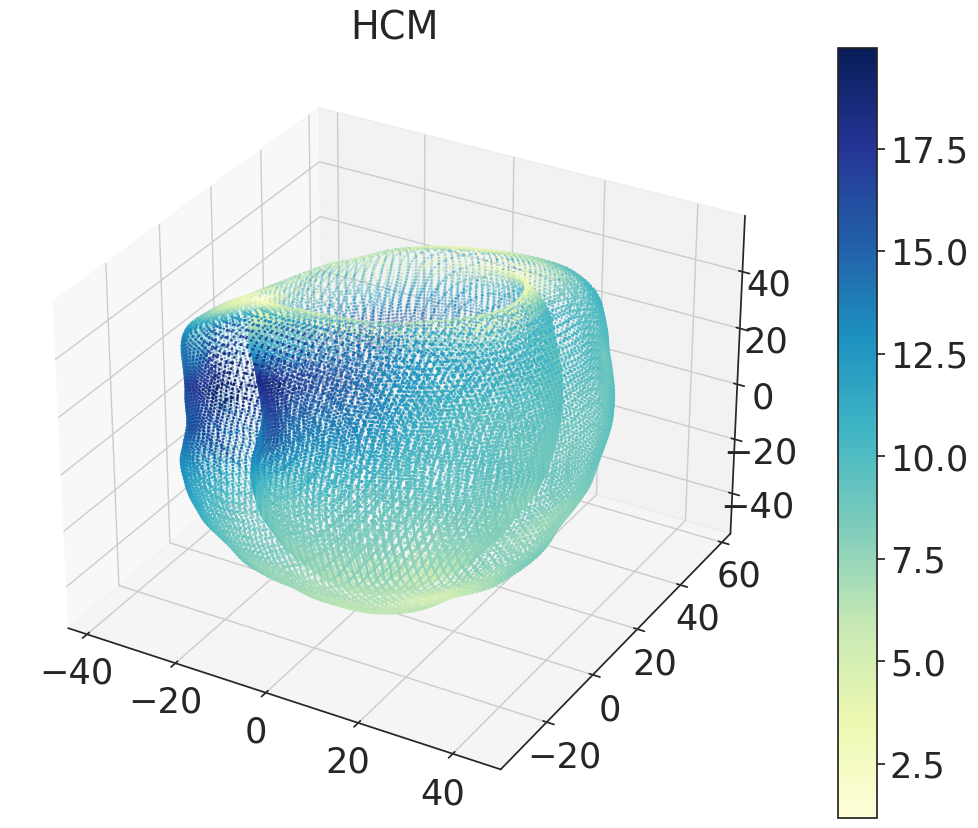

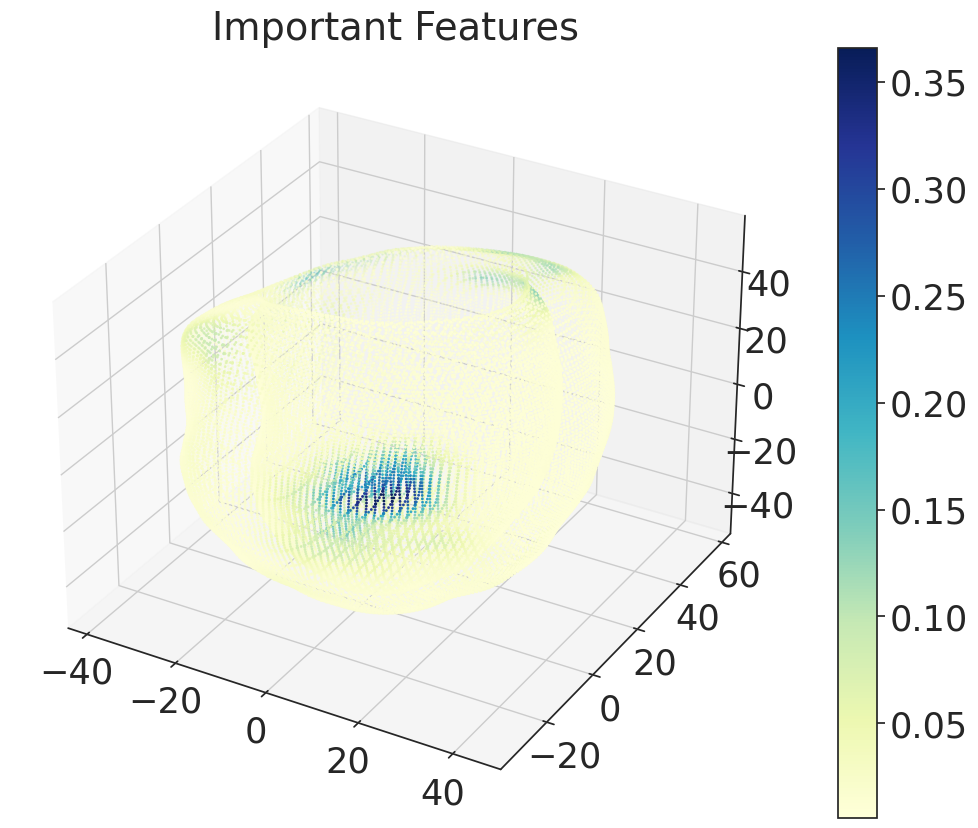

In [44]:
cmr_importances = pd.read_csv('lavaset_feature_impo_10000t100nnHCMvsHC1273_random_state10.csv')
cmr_importances = cmr_importances.iloc[:, 3]/np.sum(cmr_importances.iloc[:, 3])
heart_hc = pd.read_csv(
    '~/Documents/CMR_WT/27k_WT_txts/1008480_lv_myoed_wallthickness.txt', sep=" ", header=None)
x = np.array(heart_hc.iloc[:, 0])
y = np.array(heart_hc.iloc[:, 1])
z = np.array(heart_hc.iloc[:, 2])
wt = np.array(cmr_importances)*100

fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
# wt = np.array(heart_hcm.iloc[:, 3][:20])
sc = ax.scatter(x, y, z, s=1, depthshade=True, c=wt, cmap='YlGnBu')
plt.title('Important Features')
plt.colorbar(sc)
plt.show()
#fig.savefig('3dventr.svg', format='svg', dpi=1200)

heart_hcm = pd.read_csv(
    '~/Documents/CMR_WT/27k_WT_txts/1008480_lv_myoed_wallthickness.txt', sep=" ", header=None)
x = np.array(heart_hcm.iloc[:, 0])
y = np.array(heart_hcm.iloc[:, 1])
z = np.array(heart_hcm.iloc[:, 2])
wt = np.array(heart_hcm.iloc[:, 3])

fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
# wt = np.array(heart_hcm.iloc[:, 3][:20])
sc = ax.scatter(x, y, z, s=3, depthshade=True, c=wt, cmap='YlGnBu')
plt.title('HC')
plt.colorbar(sc)
plt.show()


heart_hcm = pd.read_csv(
    '~/Documents/CMR_WT/27k_WT_txts/1985320_lv_myoed_wallthickness.txt', sep=" ", header=None)
x = np.array(heart_hcm.iloc[:, 0])
y = np.array(heart_hcm.iloc[:, 1])
z = np.array(heart_hcm.iloc[:, 2])
wt = np.array(heart_hcm.iloc[:, 3])

fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
# wt = np.array(heart_hcm.iloc[:, 3][:20])
sc = ax.scatter(x, y, z, s=1, depthshade=True, c=wt, cmap='YlGnBu')
plt.title('HCM')
plt.colorbar(sc)
plt.show()

x = np.array(heart_hcm.iloc[:, 0])
y = np.array(heart_hcm.iloc[:, 1])
z = np.array(heart_hcm.iloc[:, 2])
wt = np.array(cmr_importances)*1000

fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
# wt = np.array(heart_hcm.iloc[:, 3][:20])
sc = ax.scatter(x, y, z, s=1, depthshade=True, c=wt, cmap='YlGnBu')
plt.title('Important Features')
plt.colorbar(sc)
plt.show()
#fig.savefig('3dventr.svg', format='svg', dpi=1200)

In [7]:
 nmr_peaks.columns[3:]

Index(['HC,IBS-subtypes=1-4', '0.5005', '0.5010', '0.5015', '0.5020', '0.5025',
       '0.5030', '0.5035', '0.5040', '0.5045',
       ...
       '9.9951', '9.9956', '9.9961', '9.9966', '9.9971', '9.9976', '9.9981',
       '9.9986', '9.9991', '9.9996'],
      dtype='object', length=18601)

In [21]:
X = nmr_peaks.columns[3:15].to_numpy(dtype=float)
display(X.shape)
if X.ndim == 1:
    print('its 1D vector')
X = np.append([X], [nmr_peaks.columns[3:15].to_numpy(dtype=float)], axis=0)
display(X.T.shape)


kdtree = KDTree(X.T)
# logging.warning('here')
points = kdtree.query(X.T,11)[1]
display(points)


X = nmr_peaks.iloc[:, 3:15].to_numpy(dtype=float)
# X = np.append([X], [nmr_peaks.iloc[:, 3:15].to_numpy(dtype=float)], axis=0)
display(X.T)
kdtree = KDTree(X.T)
# logging.warning('here')
dist, points = kdtree.query(X.T,11)
points
# pd.DataFrame(points).to_csv('nmr_20nn_index.csv', index=False)

(12,)

its 1D vector


(12, 2)

array([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10],
       [ 1,  2,  0,  3,  4,  5,  6,  7,  8,  9, 10],
       [ 2,  1,  3,  4,  0,  5,  6,  7,  8,  9, 10],
       [ 3,  4,  2,  5,  1,  6,  0,  7,  8,  9, 10],
       [ 4,  3,  5,  6,  2,  1,  7,  8,  0,  9, 10],
       [ 5,  6,  4,  7,  3,  8,  2,  9,  1, 10,  0],
       [ 6,  5,  7,  4,  8,  3,  9, 10,  2,  1, 11],
       [ 7,  8,  6,  5,  9, 10,  4, 11,  3,  2,  1],
       [ 8,  7,  9, 10,  6,  5, 11,  4,  3,  2,  1],
       [ 9, 10,  8, 11,  7,  6,  5,  4,  3,  2,  1],
       [10,  9, 11,  8,  7,  6,  5,  4,  3,  2,  1],
       [11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1]])

array([[1415.89933793, 1549.12559854, 2603.7116221 , ...,  384.94461213,
        3332.68181595, 2705.9750194 ],
       [2055.33199565, 1580.09031374, 1657.46492921, ..., 2222.58399632,
        2629.89110155,  549.29988136],
       [1780.55556829, 1484.27424158,  488.54208113, ..., 1390.41659581,
        2009.07195417, 1175.1821884 ],
       ...,
       [1734.25050985, 2619.78798822, 2003.0444541 , ..., 1459.23774301,
        1639.05816296, 1895.47111043],
       [1338.70535688, 3328.78592419, 2386.64537548, ..., 1508.57083831,
        2332.93544085, 1688.5567775 ],
       [2083.44363037, 2106.11903714, 3442.96621659, ..., 3116.93092119,
        1893.03288807,  982.96956783]])

array([[ 0,  1,  7,  2,  4,  3, 10,  8,  9,  6, 11],
       [ 1,  2,  0,  3,  4,  7,  6, 11, 10,  5,  9],
       [ 2,  3,  1,  4,  0,  6,  7,  9,  5, 10,  8],
       [ 3,  4,  2,  1,  5,  9,  6,  7, 10,  8,  0],
       [ 4,  3,  5,  6,  7,  2,  1, 10,  9,  8,  0],
       [ 5,  4,  6,  3,  7,  8,  9,  1, 10,  2, 11],
       [ 6,  7,  5,  8,  4,  3,  9,  2,  1, 10, 11],
       [ 7,  6,  8,  9,  4,  3,  5, 10,  0,  1, 11],
       [ 8,  9,  7,  6, 10,  5,  3,  4,  0,  1,  2],
       [ 9,  8, 10,  7,  3, 11,  6,  4,  5,  1,  2],
       [10, 11,  9,  3,  4,  8,  7,  6,  1,  0,  5],
       [11, 10,  9,  1,  6,  7,  4,  3,  0,  8,  5]])

In [ ]:
heart_hc = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1008480_lv_myoed_wallthickness.txt', sep=" ", header=None)
heart_hcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1985320_lv_myoed_wallthickness.txt', sep=" ", header=None)

In [ ]:
X = heart_hc.iloc[:, :-1]
# print(X.iloc[2])
#X = (np.array(data.iloc[0, :])).flatten()

kdtree = KDTree(X)
# logging.warning('here')
dist, points = kdtree.query(X,101)
print(points)
pd.DataFrame(points).to_csv('cmr_100nn_index.csv', index=False)



In [ ]:
x_axis = nmr_peaks.columns.astype('float')
nmr_peaks_avg = nmr_peaks.mean(axis=0)


In [ ]:
frange = range(12000,14000)
df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['gini importance'] = importances3.values[frange]
df['gini importance'] = df['gini importance']*100
df['δ'] = x_axis[frange]

# df = df[df['3']!=0]
fig = plt.figure(figsize=(20, 10))
sns.set(font_scale=1.3,  style='white')
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='gnuplot', s=30)
norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])
# here the pink peak is isoleucine 


plt.ylabel('')
plt.legend('')
# ax.get_legend()
ax.figure.colorbar(sm)
#fig.savefig('isoleucine.tiff', format='tiff')

df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['gini importance'] = importances4.values[frange]
df['gini importance'] = df['gini importance']*100
df['δ'] = x_axis[frange]



# df = df[df['3']!=0]
display(df['gini importance'].max())
plt.figure(figsize=(20, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='gnuplot', s=30)
norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])
plt.ylabel('')
plt.legend('')
# ax.get_legend()
ax.figure.colorbar(sm)




In [ ]:
#frange = range(500,1500)
df = pd.DataFrame({'1':nmr_peaks_avg})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['gini importance'] = importances3.values
df['gini importance'] = df['gini importance']*100
df['δ'] = x_axis
# df = df[df['3']!=0]
fig = plt.figure(figsize=(30, 10))
sns.set(font_scale=1.3,  style='white')
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='gnuplot', s=30)
norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])
# here the pink peak is isoleucine 


plt.ylabel('')
plt.legend('')
# ax.get_legend()
ax.figure.colorbar(sm)
#fig.savefig('isoleucine.tiff', format='tiff')

df = pd.DataFrame({'1':nmr_peaks_avg})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['gini importance'] = importances4.values
df['gini importance'] = df['gini importance']*100
df['δ'] = x_axis
# df = df[df['3']!=0]
display(df['gini importance'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='gnuplot', s=30)
norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])
plt.ylabel('')
plt.legend('')
# ax.get_legend()
ax.figure.colorbar(sm)


In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg})
df['2'] = list(range(0, nmr_peaks_10k15k.iloc[1, :].shape[0]))  
df['3'] = importances.values
df['3'] = df['3']



# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)
display(df)

In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv').iloc[:, 3:]
impo_sk = pd.read_csv('feature_impo_pca_15_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)
frange = range(1500,2500)
df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
df['2'] = list(range(0, nmr_peaks.iloc[1, frange].shape[0]))  
df['3'] = impo_sk.values[frange]
df['3'] = df['3']*100

# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(20, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)


impo_sk = pd.read_csv('feature_impo_pca_100_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)
frange = range(1500,2500)
df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
df['2'] = list(range(0, nmr_peaks.iloc[1, frange].shape[0]))  
df['3'] = impo_sk.values[frange]
df['3'] = df['3']*100

# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(20, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv').iloc[:, 3:]
impo_sk = pd.read_csv('feature_impo_pca_10t50nn.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)
frange = range(12000,14000)
df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
df['2'] = list(range(0, nmr_peaks.iloc[1, frange].shape[0]))  
df['3'] = impo_sk.values[frange]
df['3'] = df['3']*100

# df = df[df['3']!=0]
plt.figure(figsize=(20, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)


impo_sk = pd.read_csv('feature_impo_pca_100_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)
frange = range(12000,14000)
df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
df['2'] = list(range(0, nmr_peaks.iloc[1, frange].shape[0]))  
df['3'] = impo_sk.values[frange]
df['3'] = df['3']*100

# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(20, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [8]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv').iloc[:, 3:]
impo_sk = pd.read_csv('feature_impo_pca_15_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)

df = pd.DataFrame({'1':nmr_peaks_avg[2000:4000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 2000:4000].shape[0]))  
df['3'] = impo_sk.values[2000:4000]
df['3'] = df['3']*100

# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(50, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)
display(df)

FileNotFoundError: [Errno 2] No such file or directory: 'feature_impo_pca_15_all_features.csv'

In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv').iloc[:, 3:]
impo_sk = pd.read_csv('feature_impo_pca_10_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)

df = pd.DataFrame({'1':nmr_peaks_avg[2000:4000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 2000:4000].shape[0]))  
df['3'] = impo_sk.values[2000:4000]
df['3'] = df['3']*100

# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(50, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)
display(df)

In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv').iloc[:, 3:]
impo_sk = pd.read_csv('feature_impo_10_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)

df = pd.DataFrame({'1':nmr_peaks_avg[2000:5000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 2000:5000].shape[0]))  
df['3'] = impo_sk.values[2000:5000]
df['3'] = df['3']*100



# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(50, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)
display(df)

In [ ]:
nmr_peaks.iloc[1, 10000:150000]

In [ ]:
leaves_lavaset = pd.read_csv('bonsai-dt/bonsai/leaves_lavaset10v2.csv')
# for i in leaves_lavaset['eqs'][:100]:
#     print(i)
leaves_lavaset.iloc[1, 1]

In [ ]:
leaves_lavaset.iloc[2, 1]

In [ ]:
nmr_peaks_avg = nmr_peaks.mean(axis=0)
# nmr_peaks_avg.index

In [ ]:
importances = pd.read_csv('bonsai-dt/bonsai/feature_impo_pca_RF10_v2.csv').iloc[:, 1:]
df = pd.DataFrame({'1':nmr_peaks_avg})
df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['3'] = importances.values
df['3'] = df['3']



df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='viridis', s=10)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)
display(df)

In [ ]:
# fig = plt.figure(figsize=(15, 10))
# sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks_avg[:4000].shape[0]))
# fig.savefig('specturm.svg', format='svg', dpi=1200)

heart_hcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1985320_lv_myoed_wallthickness.txt', sep=" ", header=None)
x = np.array(heart_hcm.iloc[:, 0])
y = np.array(heart_hcm.iloc[:, 1])
z = np.array(heart_hcm.iloc[:, 2])
wt = np.array(heart_hcm.iloc[:, 3])

fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
# wt = np.array(heart_hcm.iloc[:, 3][:20])
sc = ax.scatter(x, y, z, s=1, depthshade=True, c=wt, cmap='YlGnBu')
# plt.title('HCM')
# plt.colorbar(sc)
plt.show()
fig.savefig('3dventr.svg', format='svg', dpi=1200)




In [ ]:
importances[:4000]['0'].unique()

In [ ]:
unique = importances[:4000]['0'].unique()
display(unique)
palette = dict(zip(unique, sns.color_palette(n_colors=len(unique))))


In [ ]:
from sklearn.metrics import accuracy_score
test = [1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]
pred = [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0]
print(accuracy_score(test, pred))

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[0:2500]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 0:2500].shape[0]))  
df['3'] = importances.values[0:2500]
df

# df = pd.DataFrame({'1':nmr_peaks_avg})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
# df['3'] = importances.values
# df

# df = df[df['3']!=0].reset_index()
df['3'] = df['3']*1000
df

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[0:2500]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 0:2500].shape[0]))  
df['3'] = importances.values[0:2500]
df['3'] = df['3']*1000

display(df[2400:2500])

df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='Spectral', s=10)
# norm = plt.Normalize(df['3'].min(), df['3'].max())
# sm = plt.cm.ScalarMappable(cmap="Spectral", norm=norm)
# sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[2500:5000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 2500:5000].shape[0]))  
df['3'] = importances.values[2500:5000]
# df['3'] = df['3']*1000
display(df)

df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='Spectral', s=10)
# norm = plt.Normalize(df['3'].min(), df['3'].max())
# sm = plt.cm.ScalarMappable(cmap="Spectral", norm=norm)
# sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[5000:10000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 5000:10000].shape[0]))  
df['3'] = importances.values[5000:10000]
# df['3'] = df['3']*1000
display(df)

df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='Spectral', s=10)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="Spectral", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[11:18588]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 11:18588].shape[0]))  
df['3'] = importances.values[11:18588]
# df['3'] = df['3']*1000
display(df)

df = df[df['3']!=0]
display(df['3'].min())
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='viridis', s=10)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[11:2000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 11:2000].shape[0]))  
df['3'] = importances.values[11:2000]
# df['3'] = df['3']*1000
display(df)

df = df[df['3']!=0]
display(df['3'].min())
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='viridis', s=10)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
display(df[df['2'].isin(range(1450,1550))])
# display(df[df['2'].isin(range(11, 18588))].max())

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg})
df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['3'] = importances.values
# df['3'] = df['3']*1000
display(df)

df = df[df['3']!=0]
display(df['3'].min())
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='viridis', s=10)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 100)
display(df[df['2'].isin(range(18550,18600))])
display(df[df['2'].isin(range(11, 18588))].max())

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[7000:10000].values})
df['2'] = list(range(0, nmr_peaks.iloc[1, 7000:10000].shape[0]))  
df['3'] = importances[7000:10000].values
df

df = pd.DataFrame({'1':nmr_peaks_avg.values})
df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['3'] = importances.values
df = df[df['3']!=0].reset_index()
df

In [ ]:
plt.figure(figsize=(15, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
sns.scatterplot(data=df,x='2',y='1', hue='3', palette='hsv')

In [ ]:
sns.scatterplot(y= nmr_peaks.iloc[1,:], x=range(0, nmr_peaks.iloc[1, :].shape[0]), hue=dict(zip(range(0,  nmr_peaks.iloc[1, :].shape[0]),importances.iloc[:, 0])))
# sns.lineplot(x=feat.iloc[:, 0], y=feat.iloc[:, 1])
plt.xlabel('NMR variables')
plt.ylabel('Importance')

In [ ]:
pca_acc = np.array([0.6666666666666666,0.6481481481481481,0.5740740740740741, 0.6111111111111112, 0.6111111111111112, 0.5740740740740741])
no_pca_acc = np.array([0.6481481481481481, 0.5740740740740741, 0.5740740740740741, 0.6296296296296297, 0.6296296296296297, 0.6666666666666666])
display(round(np.mean(no_pca_acc),3), round(np.std(no_pca_acc),3))
display(round(np.mean(pca_acc),3), round(np.std(pca_acc),3))
scipy.stats.ttest_ind(pca_acc, no_pca_acc)

In [ ]:
metadata = pd.read_csv('~/Documents/metadata/ukbbMetaData.txt', sep="\t", header=0)
metadata['eid_47602'] = pd.to_numeric(metadata['eid_47602'], downcast='integer')
metadata['eid_18545'] = pd.to_numeric(metadata['eid_18545'], downcast='integer')
metadata['eid_40616'] = pd.to_numeric(metadata['eid_40616'], downcast='integer')
cmr_data = pd.read_csv('~/Documents/metadata/CMR_metadata_Mar20_K.txt', sep=' ')
cmr_data['eid_47602'] = pd.to_numeric(cmr_data['eid_47602'], downcast='integer')
cmr_data['eid_18545'] = pd.to_numeric(cmr_data['eid_18545'], downcast='integer')
cmr_data['eid_40616'] = pd.to_numeric(cmr_data['eid_40616'], downcast='integer')
metadata.hasCMR.value_counts()

In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv')

nmr_peaks.iloc[:, 3:]

In [ ]:
pd.DataFrame(points).to_csv('nmr_knn_index.csv', index=False)

In [ ]:
indexes = pd.read_csv('nmr_knn_index.csv')
indexes.iloc[0].tolist()


In [ ]:
# X = StandardScaler().fit_transform(nmr_peaks.iloc[:, 3:])
# kdtree = KDTree(X)
# # logging.warning('here')
# dist, points = kdtree.query_radius(X,r=130, return_distance=True)
# print(points)
# print(dist)

In [ ]:
heart_hcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1985320_lv_myoed_wallthickness.txt', sep=" ", header=None)
heart_dcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/3962620_lv_myoed_wallthickness.txt', sep=" ", header=None)
heart_dcm = heart_dcm.drop(3, axis=1)
heart_hcm = heart_hcm.drop(3, axis=1)
data = heart_dcm.apply(lambda r: tuple(r), axis=1).apply(np.array)
data2 = heart_hcm.apply(lambda r: tuple(r), axis=1).apply(np.array)
data = pd.DataFrame (data=[data, data2])
display(data)
print(data.loc[:, 45801])

## creating KDTree and taking the nearest neighbour points 
X = heart_hcm.iloc[:, :-1]
# print(X.iloc[2])
X = (np.array(data.iloc[0, :])).flatten()
print(X)
kdtree = KDTree(X)
# logging.warning('here')
dist, points = kdtree.query(X,11)
print(points)

In [ ]:
cmr_txt_ids = []
wt_df = np.zeros(46808)

# wt_df = pd.DataFrame()
for path, dirs, files in os.walk('/home/mk218/Documents/CMR_WT/27k_WT_txts'):
    print(path, dirs)
#     print(wt_df.shape)
    for filename in files:
        # wt = pd.read_csv(f'/home/mk218/Documents/CMR_WT/27k_WT_txts/{filename}', sep=" ", header=None).iloc[:, 3].to_numpy()
        # wt_df = np.vstack((wt_df, wt))
#         pd.concat([wt_df, wt])
        filename = filename.replace('_lv_myoed_wallthickness.txt','')
        cmr_txt_ids.append(float(filename))
cmr_txt_ids = [int(i) for i in cmr_txt_ids]



In [ ]:
cmr_df = metadata[metadata['eid_18545'].isin(cmr_txt_ids)]
hcm = cmr_df[cmr_df.hasHCM == True]
hcm
healthy = cmr_df[(cmr_df.hasanyCM == False) & (cmr_df.hasHypertension == False)]
healthy_ids = healthy[:25].eid_18545.tolist()
hcm_ids = hcm.eid_18545.tolist()

In [ ]:
umapdf = pd.DataFrame(wt_df[1:], columns=range(0, 46808))

In [ ]:
fit = umap.UMAP(n_neighbors=100,
        min_dist=1,
        n_components=2,
        metric='euclidean')
%time u_ham = fit.fit_transform(umapdf)

In [ ]:
pd.DataFrame(u_ham)

In [ ]:
plt.figure(figsize=(13,7))
sns.scatterplot(x=0, y=1, data=pd.DataFrame(u_ham), palette='Set1', s=20)
plt.xlabel('UMAP\N{SUBSCRIPT ONE}')
plt.ylabel('UMAP\N{SUBSCRIPT TWO}')

In [ ]:
cmr_txt_ids_meta = metadata[metadata['eid_18545'].isin(cmr_txt_ids)]
display(cmr_txt_ids_meta[cmr_txt_ids_meta.hasanyCM == True].shape)
display(cmr_txt_ids_meta[cmr_txt_ids_meta.hasDCM == True].shape)
display(cmr_txt_ids_meta[cmr_txt_ids_meta.hasHCM == True].shape)

In [ ]:
umap_dist = pd.read_csv('umap_dist.csv', usecols=[1,2,3])
umap_dist 

In [ ]:
round(0.5)

In [ ]:
sns.set_style("darkgrid")
sns.set_context(context='paper',font_scale=1.5)


fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
wt = np.array(heart_hcm.iloc[:, 3])

sc = ax.scatter(umap_dist.iloc[:, 1], umap_dist.iloc[:, 0], umap_dist.iloc[:, 2], s=2, c=wt, depthshade=True, cmap='YlGnBu')



plt.title('UMAP')
plt.xlabel('UMAP\N{SUBSCRIPT ONE}')
plt.ylabel('UMAP\N{SUBSCRIPT TWO}')
plt.show()



In [ ]:
heart_hcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1985320_lv_myoed_wallthickness.txt', sep=" ", header=None)
x = np.array(heart_hcm.iloc[:, 0])
y = np.array(heart_hcm.iloc[:, 1])
z = np.array(heart_hcm.iloc[:, 2])
wt = np.array(heart_hcm.iloc[:, 3])

fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
# wt = np.array(heart_hcm.iloc[:, 3][:20])
sc = ax.scatter(x, y, z, s=3, depthshade=True, c=wt, cmap='YlGnBu')
plt.title('HCM')
plt.colorbar(sc)
plt.show()


In [ ]:
X = heart_hcm.iloc[:, :-1]
# kdtree = KDTree(X)
# dist, points = kdtree.query(X,11)

dist_matrix = distance_matrix(X,X)
print(dist_matrix)



In [ ]:
no_zeros = np.concatenate(dist_matrix).ravel()
no_zeros = no_zeros[no_zeros != 0]
print(no_zeros)


In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv')
display(nmr_peaks)
X = np.array(nmr_peaks.iloc[:10, 3:12])
y = np.array(nmr_peaks.iloc[:10, 1])
display(pd.DataFrame(X))
display(X[0:8,3:3])

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
display(pd.DataFrame(X_train))

In [ ]:
x_min =np.nanpercentile(X_train, q=0.5, axis=0)
x_max = np.nanpercentile(X_train, q=99.5, axis=0)
j=0
x_j = X_train[~np.isnan(X_train[:,j]),j]
display(x_j)
unique_values = np.unique(x_j)
display(unique_values)
display(x_min, x_max)
mask = np.logical_and(unique_values >= x_min[j], unique_values <= x_max[j])
n_unique = np.sum(mask)
n_bin = max(n_unique, 1)
(x_max[j] - x_min[j])/n_bin
max(n_bin - 1, 1)

In [ ]:
# pca_df = 0
# X = np.array(nmr_peaks.iloc[:, 3:30])
# display(X)
# display(pd.DataFrame(X))
# display((X[:, 1]))
# display(pd.DataFrame(X[:, :(3+10)]))
# X_pca = StandardScaler().fit_transform(X[:, (1-10):(1+10)])
# display(pd.DataFrame(X_pca))
# pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca))


In [ ]:
# pca_df = []
pca_df = np.zeros((X.shape[0],1)) # initiating nested array with array number = # of samples
for f_idx in range(50):
    if f_idx < 10:
        indeces = list(range(f_idx-10, f_idx+10))
        indeces = [i for i in indeces if i>=0]
        X_pca = StandardScaler().fit_transform(X[:, indeces])# takes value for relevant feature in all training samples 
        # pca_df = np.insert(pca_df, obj=f_idx, values=PCA(n_components=1).fit_transform(X_pca), axis=0)
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca), axis=1)

    elif f_idx > (50-10):
        indeces = list(range(f_idx-10, 50))
        indeces = [i for i in indeces if i>=0]
        X_pca = StandardScaler().fit_transform(X[:, indeces])# takes value for relevant feature in all training samples 
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca), axis=1)
    elif f_idx > 10:
        indeces = list(range(f_idx-10, f_idx+10))
        X_pca = StandardScaler().fit_transform(X[:, indeces])# takes value for relevant feature in all training samples 
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca), axis=1)
pca_df = np.delete(pca_df, np.s_[0], 1) # deleting the initiating 0's values
display(pd.DataFrame(pca_df))                

In [ ]:
pca_df = 0
for f_idx in range(X.shape[1]):
    indeces = list(range(f_idx-10, f_idx+10)
    
    if f_idx > 10:
        X_pca = StandardScaler().fit_transform(X[:, (f_idx-10):(f_idx+10)]) # takes value for relevant feature in all training samples 
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca))
    if f_idx < 10: 
        X_pca = StandardScaler().fit_transform(X[:, :(f_idx+10)])
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca))
    if f_idx > (X.shape[1]-10):
        X_pca = StandardScaler().fit_transform(X[:, (f_idx-10):])
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca))
pd.DataFrame(pca_df).to_csv('pca_df2.csv')
#    pca_df.to_csv('pca_df.csv')
    


In [ ]:
3739/267

In [ ]:
df = pd.read_csv('pca_df2.csv')
df

In [ ]:
pca1.explained_variance_

In [ ]:
pca2.explained_variance_